# Vector Data with `sf`
### Working with Spatial Features in R

---

> *"What begins as undifferentiated space becomes place as we get to know it better and endow it with value."*  
— Yi-Fu Tuan, *Topophilia* (1974)

---

## Introduction

In Part 1, we discussed what spatial ecology is, why it matters, and what kinds of data exist. We understood that spatial data come in two fundamental types, **vector** and **raster**, and that the modern R-spatial ecosystem is built around `sf`, `terra`, and `stars`, supported by GDAL, GEOS, and PROJ.

Now we build things. This part marks the transition from theory to practice. We begin with **vector data** (discrete features): province boundaries, protected areas, city locations, rivers, roads. Vector data are what most ecologists encounter first, and the `sf` package makes working with them feel as natural as working with a `tidyverse` data frame.

Throughout this notebook, we use **South Africa** as our study system. South Africa is one of the most biogeographically interesting countries on Earth: it spans three oceans, two biodiversity hotspots (the Cape Floristic Region and the Succulent Karoo), and nine provinces whose human and ecological geographies are different.

There are two parts/sections in this notebook that teach the same workflow in two different ways:

- **Section 1 — The Manual Approach**: You download shapefiles from trusted sources, load them from your computer, and work through the full vector data pipeline.
- **Section 2 — The Programmatic Approach**: You let R packages fetch the same data for you. No browser downloads, no file management — just code.

Both sections produce the same kind of final map. Understanding both approaches, and knowing *when* each is appropriate, is a professional skill.

## What You Will Learn

By the end of this notebook you will be able to:

- Read shapefiles and GeoPackages into R with `st_read()`
- Understand and inspect the structure of an `sf` object
- Check and transform coordinate reference systems with `st_crs()` and `st_transform()`
- Join tabular data to spatial objects using `tidyverse` join functions
- Perform basic geometry operations: `st_buffer()`, `st_intersection()`, `st_union()`, `st_distance()`
- Produce styled, informative maps with `geom_sf()` in `ggplot2`
- Fetch spatial data programmatically using `geodata`, `rnaturalearth`, and `wdpar`

## Packages

The core packages for this notebook are listed below. Install any you do not yet have by uncommenting the `install.packages()` line.

In [1]:
# install.packages(c(
#   "sf", "tidyverse", "ggplot2", "ggspatial", "patchwork",
#   "scales", "ggrepel", "rnaturalearth", "rnaturalearthdata",
#   "geodata", "wdpar", "terra", "remotes"
# ))
# remotes::install_github("ropensci/rnaturalearthhires")  # high-resolution borders

suppressPackageStartupMessages({
    library(sf)           # the workhorse: vector data in R
    library(tidyverse)    # data wrangling and the pipe
    library(ggplot2)      # grammar of graphics
    library(ggspatial)    # scale bars and north arrows for ggplot2 maps
    library(patchwork)    # composing multi-panel figures
    library(scales)       # nice axis labels (comma(), percent(), etc.)
    library(ggrepel)      # non-overlapping text labels
})

In [2]:
# Set consistent plot dimensions for the notebook
options(
  repr.plot.width  = 10,
  repr.plot.height = 7,
  repr.plot.res    = 200
)

---

## Section 1: The Manual Approach — Working with Downloaded Shapefiles

In this section, you will download two spatial datasets from authoritative online repositories, load them into R, explore them, transform them, and ultimately combine them into a publication-quality map of South Africa. Every step is explained in detail.

---

### 1.1 What is a Shapefile? What is a GeoPackage?

Before you can load data you need to understand what you are loading.

A **shapefile** is actually a collection of at least three files that must live in the same folder and share the same base name:

| File extension | Contents |
|---|---|
| `.shp` | The geometry itself (coordinates of points, lines, or polygons) |
| `.dbf` | The attribute table (columns of data associated with each feature) |
| `.shx` | A spatial index linking the `.shp` and `.dbf` |
| `.prj` | *(Optional but important)* The coordinate reference system |
| `.cpg` | *(Optional)* Character encoding of the `.dbf` |

The shapefile format was developed by ESRI in the early 1990s and remains the most widely used vector format worldwide, even though it has serious limitations: column names are truncated to 10 characters, file sizes are capped, and you need to keep track of several files at once. Modern workflows increasingly prefer the **GeoPackage** (`.gpkg`), a single-file, open-standard container based on SQLite that can hold multiple layers, has no size limit, supports longer field names, and is fully readable by `sf`. You load both with the same function.

> **Rule of thumb**: prefer GeoPackage for any data you create or export yourself. Use shapefiles when a data provider only offers that format.

### 1.2 Downloading Your Data

We will work with two datasets. Follow the instructions below to download them **before** running the code in this section.

---

**Dataset 1 — South African Provincial Boundaries (GADM v4.1)**

GADM (Global Administrative Areas, [gadm.org](https://gadm.org)) is the most authoritative source of administrative boundaries. It is updated regularly, free to use for academic purposes, and covers the entire world.

1. Navigate to [https://gadm.org/download_country.html](https://gadm.org/download_country.html)
2. In the *Country* dropdown, select **South Africa**
3. Click **Shapefile** to download the full package
4. Unzip the archive. You will find files for Level 0 (country), Level 1 (provinces), and Level 2 (districts). We need **Level 1** (`gadm41_ZAF_1.*`) and **Level 0** (`gadm41_ZAF_0.*`)
5. Place these files in a folder called `data/` inside your working directory

---

**Dataset 2 — South African Protected Areas (WDPA)**

The World Database on Protected Areas ([protectedplanet.net](https://www.protectedplanet.net)) is the global standard for protected area data, maintained by UNEP-WCMC and IUCN.

1. Navigate to [https://www.protectedplanet.net/country/ZAF](https://www.protectedplanet.net/country/ZAF)
2. Click **Download** → select **Shapefile** format
3. Extract the archive. You will see multiple folders. We want the zip file titled `WDPA_WDOECM_May2026_Public_ZAF_shp_0` (Month and year displayed will change depending on the day of download).
4. Extract the zip file and you will see the shapefile (WDPA_WDOECM_May2026_Public_ZAF_shp-polygons)
5. Place this and its associated files (`.dbf`, `.shx`, `.prj`) into your `data/` folder as well

---

Once downloaded, your `data/` folder should look something like this:

```
data/
├── gadm41_ZAF_0.shp  (.dbf  .shx  .prj)
├── gadm41_ZAF_1.shp  (.dbf  .shx  .prj)
└── WDPA_WDOECM_May2026_Public_ZAF_shp-polygons.shp  (.dbf  .shx  .prj)
```

> **Setting your working directory**: In RStudio, use `Session → Set Working Directory → To Source File Location` to ensure R looks for the `data/` folder relative to where this notebook is saved.

*For the purpose of this exercise, I will not be placing the data under the `data/` folder, instead I will place them under `Data/SA_boundaries/` and `Data/SA_protected_areas` because I place every dataset under a subfolder. You can also choose to do so, which will make your life much easier.*

### 1.3 Reading Shapefiles with `st_read()`

The entry point for all vector data in `sf` is `st_read()`. It reads shapefiles, GeoPackages, GeoJSON, KML, and over 200 other formats through GDAL — the same library that powers QGIS. You give it a file path; it gives you an `sf` object.

In [3]:
# Read the South Africa provinces (GADM Level 1)
# Adjust the path if your files are in a different location
sa_provinces <- st_read("Data/SA_boundaries/gadm41_ZAF_1.shp")

Reading layer `gadm41_ZAF_1' from data source 
  `/Users/phemelo/Documents/LesHyperion/Data/SA_boundaries/gadm41_ZAF_1.shp' 
  using driver `ESRI Shapefile'
Simple feature collection with 9 features and 11 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: 16.45189 ymin: -34.83514 xmax: 32.89125 ymax: -22.12503
Geodetic CRS:  WGS 84


In [4]:
# Read the country outline (GADM Level 0)
sa_country <- st_read("Data/SA_boundaries/gadm41_ZAF_0.shp")

Reading layer `gadm41_ZAF_0' from data source 
  `/Users/phemelo/Documents/LesHyperion/Data/SA_boundaries/gadm41_ZAF_0.shp' 
  using driver `ESRI Shapefile'
Simple feature collection with 1 feature and 2 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: 16.45189 ymin: -34.83514 xmax: 32.89125 ymax: -22.12503
Geodetic CRS:  WGS 84


When `st_read()` runs, it prints a brief summary: the driver it used (ESRI Shapefile), the number of features, the number of fields, the geometry type, and the bounding box. Get into the habit of reading this output, it is your first sanity check that the data loaded correctly.

### 1.4 Exploring an `sf` Object

An `sf` object behaves almost exactly like a `data.frame` or `tibble`, with one special addition: a **geometry column** (usually named `geometry`) that stores the spatial information. Every row is one feature; every column is one attribute, except the geometry column which holds the shape.

In [5]:
# An sf object is both a data frame AND a spatial object
class(sa_provinces)

# How many features (rows) and attribute fields (columns)?
dim(sa_provinces)

# What are the columns?
names(sa_provinces)

[1] "sf"         "data.frame"

[1]  9 12

[1] "GID_1"     "GID_0"     "COUNTRY"   "NAME_1"    "VARNAME_1" "NL_NAME_1"
 [7] "TYPE_1"    "ENGTYPE_1" "CC_1"      "HASC_1"    "ISO_1"     "geometry"

In [6]:
# Peek at the attribute table — use st_drop_geometry() to ignore the geometry column
sa_provinces %>%
  st_drop_geometry() %>%
  select(NAME_1, TYPE_1, ENGTYPE_1) %>%
  head(9)

,NAME_1,TYPE_1,ENGTYPE_1
,<chr>,<chr>,<chr>
1,Eastern Cape,Provinsie,Province
2,Free State,Provinsie,Province
3,Gauteng,Provinsie,Province
4,KwaZulu-Natal,Provinsie,Province
5,Limpopo,Provinsie,Province
6,Mpumalanga,Provinsie,Province
7,North West,Provinsie,Province
8,Northern Cape,Provinsie,Province
9,Western Cape,Provinsie,Province


In [7]:
# What geometry types are stored?
st_geometry_type(sa_provinces)

[1] MULTIPOLYGON MULTIPOLYGON MULTIPOLYGON MULTIPOLYGON MULTIPOLYGON
[6] MULTIPOLYGON MULTIPOLYGON MULTIPOLYGON MULTIPOLYGON
18 Levels: GEOMETRY POINT LINESTRING POLYGON MULTIPOINT ... TRIANGLE

In [8]:
# What is the coordinate reference system?
st_crs(sa_provinces)

Coordinate Reference System:
  User input: WGS 84 
  wkt:
GEOGCRS["WGS 84",
    DATUM["World Geodetic System 1984",
        ELLIPSOID["WGS 84",6378137,298.257223563,
            LENGTHUNIT["metre",1]]],
    PRIMEM["Greenwich",0,
        ANGLEUNIT["degree",0.0174532925199433]],
    CS[ellipsoidal,2],
        AXIS["latitude",north,
            ORDER[1],
            ANGLEUNIT["degree",0.0174532925199433]],
        AXIS["longitude",east,
            ORDER[2],
            ANGLEUNIT["degree",0.0174532925199433]],
    ID["EPSG",4326]]

In [9]:
# The bounding box (spatial extent)
st_bbox(sa_provinces)

     xmin      ymin      xmax      ymax 
 16.45189 -34.83514  32.89125 -22.12503 

A few things to notice:

- `st_geometry_type()` returns `MULTIPOLYGON`. Each province is a multipolygon because some provinces include islands or disconnected territories.
- `st_crs()` should report **WGS 84 (EPSG: 4326)** — the geographic coordinate system used by GPS and most global datasets, with coordinates in decimal degrees of latitude and longitude.
- `st_bbox()` gives you the bounding box: minimum and maximum x (longitude) and y (latitude). For South Africa this should be roughly 16–33°E longitude and 22–35°S latitude — check this against a mental map.

These three checks — geometry type, CRS, bounding box — are the first things you should do with any new spatial dataset. They catch problems before they propagate.

### 1.5 Coordinate Reference Systems in Practice

You have already encountered CRS theory in Part 1. Now you will use it. The key function is `st_transform()`, which reprojects an `sf` object from one CRS to another. It calls the PROJ library internally and handles all the mathematics.

For South Africa, **WGS84 geographic coordinates (EPSG: 4326)** are fine for visualisation, but **projected coordinates** are better for any analysis involving area, distance, or buffer calculations. When you work in geographic coordinates (degrees), distances and areas are meaningless — a degree of longitude in Limpopo covers a different number of metres than a degree of longitude in Cape Town. A projected CRS solves this by converting coordinates to metres on a flat plane.

A good choice for South Africa is an **Albers Equal-Area Conic** projection centred on the country. This preserves area (critical for ecological and conservation analyses) and minimises distortion across South Africa's extent.

In [10]:
# Define the Albers Equal-Area projection for South Africa
# Parallel latitudes chosen to bracket the country; central meridian at 25E
sa_albers <- "+proj=aea +lat_1=-18 +lat_2=-32 +lat_0=-25 +lon_0=25 +x_0=0 +y_0=0 +datum=WGS84 +units=m +no_defs"

# Reproject both layers
sa_provinces_proj <- sa_provinces %>% st_transform(crs = sa_albers)
sa_country_proj   <- sa_country   %>% st_transform(crs = sa_albers)

# Confirm: coordinates are now in metres, not degrees
st_bbox(sa_provinces_proj)

      xmin       ymin       xmax       ymax 
 -830747.7 -1101501.6   778305.2   312493.6 

The bounding box values are now in **metres** from the projection origin — large numbers, but correct. Note that `st_transform()` is non-destructive: it creates a new object and leaves the original unchanged. Always preserve both the geographic and projected versions of your data.

> **A note on EPSG codes**: You can also use `st_transform(crs = 32735)` (WGS 84 / UTM Zone 35S), which is another good choice for eastern South Africa. The Albers projection above does not have its own EPSG code, so we supply the PROJ string directly. This is a common pattern for country-specific projections.

### 1.6 `geom_sf()` Map

The `geom_sf()` function is `ggplot2`'s interface to `sf` objects. It reads the geometry column automatically and determines how to draw each feature — polygons as filled shapes, lines as lines, points as points. You do not need to specify `x` and `y` aesthetics; `sf` handles that.

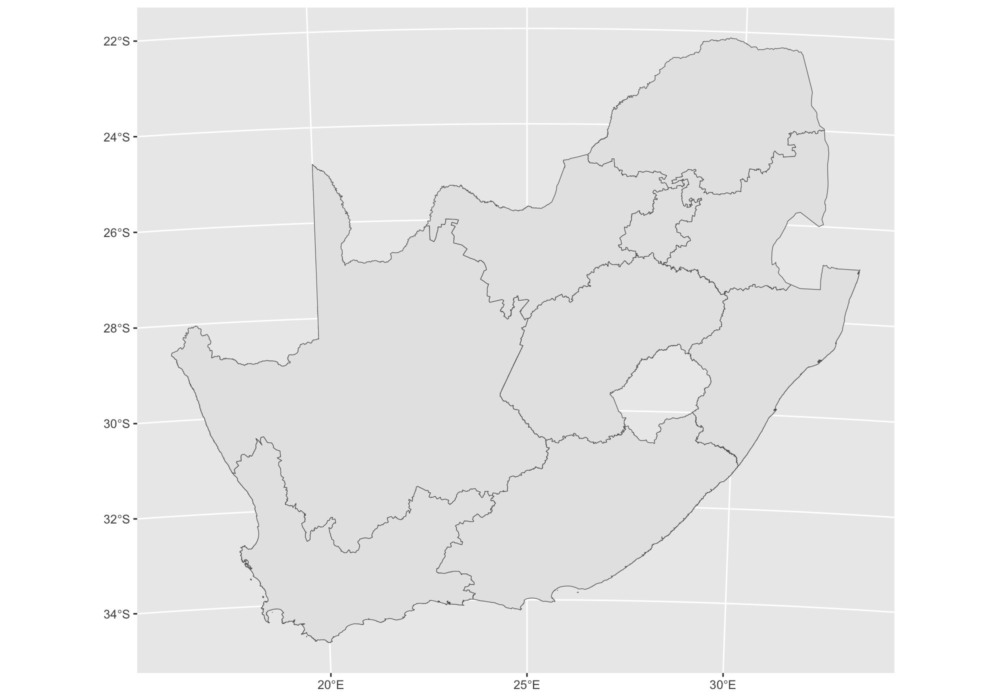

In [11]:
# The simplest possible map — one function call
ggplot(sa_provinces_proj) +
  geom_sf()

That is a recognisable map of South Africa in about 15 words of code. Now let us style it properly.

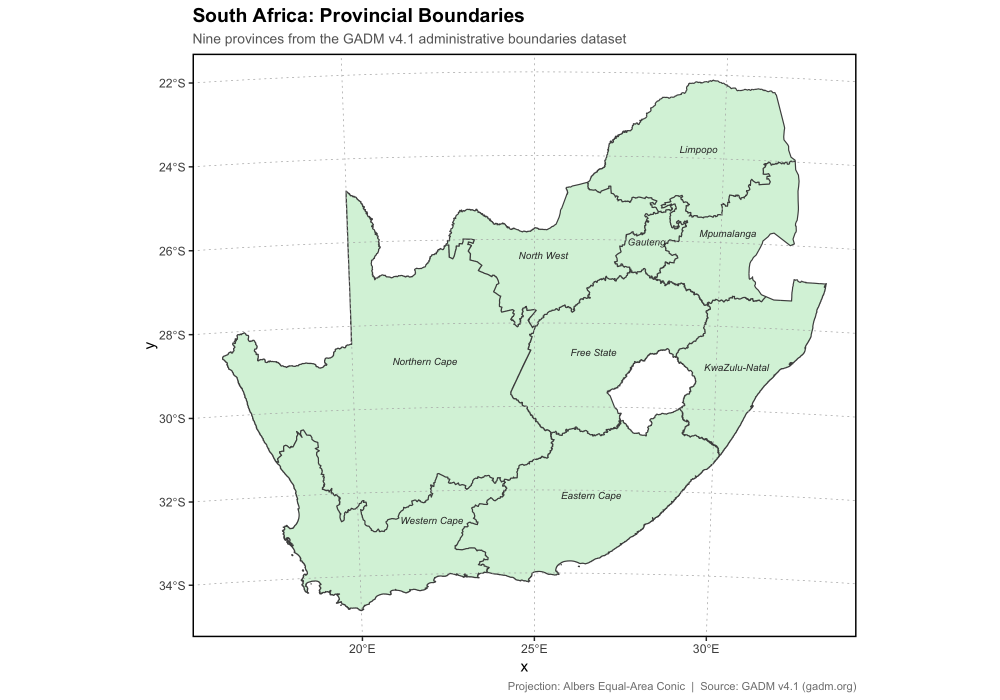

In [12]:
# A styled map: province boundaries with province names
ggplot(sa_provinces_proj) +
  geom_sf(fill      = "#d8f3dc",
          colour    = "grey30",
          linewidth = 0.4) +
  geom_sf_text(aes(label = NAME_1),
               size     = 2.5,
               colour   = "grey20",
               fontface = "italic") +
  labs(
    title    = "South Africa: Provincial Boundaries",
    subtitle = "Nine provinces from the GADM v4.1 administrative boundaries dataset",
    caption  = "Projection: Albers Equal-Area Conic  |  Source: GADM v4.1 (gadm.org)"
  ) +
  theme(
    panel.background = element_blank(),
    panel.grid.major = element_line(linetype = "dotted", colour = "grey70", linewidth = 0.25),
    panel.ontop      = TRUE,
    panel.grid.minor = element_blank(),
    panel.border     = element_rect(colour = "black", fill = NA, linewidth = 1),
    plot.title       = element_text(face = "bold", size = 14),
    plot.subtitle    = element_text(size = 10, colour = "grey40"),
    plot.caption     = element_text(size = 8,  colour = "grey50")
  )

A few `ggplot2` notes specific to spatial mapping:

- `fill` and `colour` inside `geom_sf()` but *outside* `aes()` apply a single value to all features. Move them inside `aes()` when you want to vary by an attribute — we do this in the choropleth below.
- `geom_sf_text()` places a label at the centroid of each feature automatically.
- `theme(panel.ontop = TRUE)` draws the grid lines (graticule) *on top of* filled polygons rather than beneath them, preventing fill from obscuring the grid.

### 1.7 Attribute Joins

One of the most powerful features of `sf` is that, because it is a data frame at heart, you can use the full `tidyverse` toolkit on it,  including `left_join()`. Joining tabular data to spatial objects requires only a shared key column, exactly as with non-spatial data.

We will join 2022 South African Census population figures to the province polygons. The Census 2022 was the first conducted since 2011, providing the most current demographic picture of the country (Statistics South Africa, 2023).

In [13]:
# South African Census 2022 provincial data
# Source: Statistics South Africa, Census 2022 (StatsSA, 2023)
province_data <- tibble(
  NAME_1     = c("Eastern Cape", "Free State", "Gauteng", "KwaZulu-Natal",
                 "Limpopo", "Mpumalanga", "North West", "Northern Cape", "Western Cape"),
  population = c(6976490, 2887465, 15176116, 11289086,
                 5852553, 4679786, 4072848, 1262395, 7081534),
  area_km2   = c(168966, 129825, 18178, 94361,
                 125754, 76495, 104882, 372889, 129462),
  main_biome = c("Grassland/Thicket", "Grassland", "Grassland/Savanna",
                 "Grassland/Forest", "Savanna", "Savanna/Grassland",
                 "Savanna/Grassland", "Succulent Karoo/Nama-Karoo",
                 "Fynbos/Succulent Karoo")
)

province_data

NAME_1,population,area_km2,main_biome
<chr>,<dbl>,<dbl>,<chr>
Eastern Cape,6976490,168966,Grassland/Thicket
Free State,2887465,129825,Grassland
Gauteng,15176116,18178,Grassland/Savanna
KwaZulu-Natal,11289086,94361,Grassland/Forest
Limpopo,5852553,125754,Savanna
Mpumalanga,4679786,76495,Savanna/Grassland
North West,4072848,104882,Savanna/Grassland
Northern Cape,1262395,372889,Succulent Karoo/Nama-Karoo
Western Cape,7081534,129462,Fynbos/Succulent Karoo


In [14]:
# Join demographic data to the spatial object
sa_provinces_data <- sa_provinces_proj %>%
  left_join(province_data, by = "NAME_1") %>%
  mutate(pop_density = population / area_km2)

In [15]:
# Verify: new columns should appear
sa_provinces_data %>%
  st_drop_geometry() %>%
  select(NAME_1, population, area_km2, pop_density) %>%
  arrange(desc(pop_density))

NAME_1,population,area_km2,pop_density
<chr>,<dbl>,<dbl>,<dbl>
Gauteng,15176116,18178,834.861701
KwaZulu-Natal,11289086,94361,119.637202
Mpumalanga,4679786,76495,61.177672
Western Cape,7081534,129462,54.699711
Limpopo,5852553,125754,46.539697
Eastern Cape,6976490,168966,41.289313
North West,4072848,104882,38.832669
Free State,2887465,129825,22.241209
Northern Cape,1262395,372889,3.385444


The contrast is striking: Gauteng, South Africa's smallest province, has a population density more than 200 times that of the Northern Cape — the country's largest province by area. This reflects South Africa's highly uneven urbanisation, centred on the Johannesburg–Pretoria metropolitan corridor.

### 1.8 Choropleth Map

A **choropleth** is a thematic map in which areas are shaded in proportion to a statistical variable. Now that we have joined population density to our polygons, we can map it by placing `fill = pop_density` inside `aes()`.

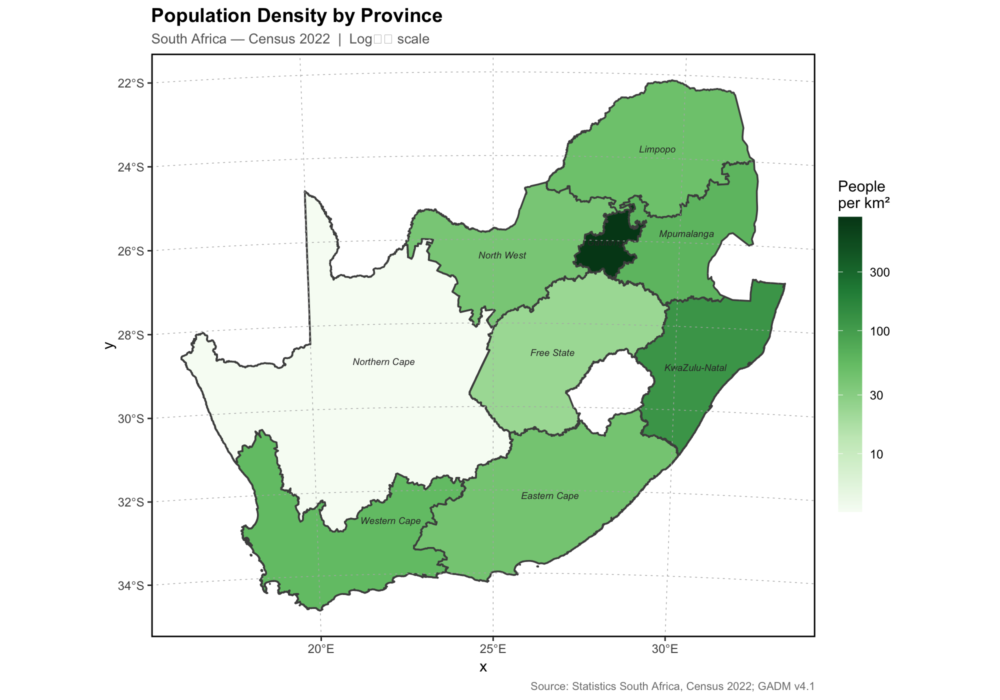

In [17]:
ggplot(sa_provinces_data) +
  geom_sf(aes(fill = pop_density),
          colour    = "grey30",
          linewidth = 0.6) +
  scale_fill_gradientn(
    colours = c("#f7fcf5", "#c7e9c0", "#74c476", "#238b45", "#00441b"),
    name    = "People\nper km\u00b2",
    labels  = comma,
    trans   = "log10"   # log scale: Gauteng dominates otherwise
  ) +
  geom_sf_text(aes(label = NAME_1),
               size     = 2.4,
               colour   = "grey20",
               fontface = "italic") +
  labs(
    title    = "Population Density by Province",
    subtitle = "South Africa — Census 2022  |  Log\u2081\u2080 scale",
    caption  = "Source: Statistics South Africa, Census 2022; GADM v4.1"
  ) +
  theme(
    panel.background  = element_blank(),
    panel.grid.major  = element_line(linetype = "dotted", colour = "grey70", linewidth = 0.25),
    panel.ontop       = TRUE,
    panel.grid.minor  = element_blank(),
    panel.border      = element_rect(colour = "black", fill = NA, linewidth = 1),
    plot.title        = element_text(face = "bold", size = 14),
    plot.subtitle     = element_text(size = 10, colour = "grey40"),
    plot.caption      = element_text(size = 8,  colour = "grey50"),
    legend.position   = "right",
    legend.key.height = unit(1.5, "cm")
  )

Notice `trans = "log10"`. Gauteng's density is so much higher than the rest that on a linear scale every other province would appear indistinguishably pale. A log transform reveals the gradient that would otherwise be invisible — this is a common challenge in choropleth mapping, and a good reason to always inspect your data distribution before choosing a colour scale.

You can also save your dataset as a GeoPackage for future use:

In [ ]:
# Save your work as a GeoPackage
# st_write(sa_provinces_data, "data/sa_provinces_enriched.gpkg")

# To reload:
# sa_provinces_data <- st_read("data/sa_provinces_enriched.gpkg")

### 1.9 Loading Protected Areas

Now we load the WDPA protected areas dataset downloaded from Protected Planet. This is a much larger and more complex dataset. South Africa has hundreds of protected areas ranging from small municipal reserves to the vast Kgalagadi Transfrontier Park spanning South Africa and Botswana.

In [20]:
# Read the WDPA polygons for South Africa
sa_protected <- st_read("data/SA_protected_areas/WDPA_WDOECM_May2026_Public_ZAF_shp-polygons.shp")

# Reproject to match the provinces layer
sa_protected_proj <- sa_protected %>% st_transform(crs = sa_albers)

cat("Number of protected area polygons:", nrow(sa_protected_proj), "\n")

Reading layer `WDPA_WDOECM_May2026_Public_ZAF_shp-polygons' from data source 
  `/Users/phemelo/Documents/LesHyperion/Data/SA_protected_areas/WDPA_WDOECM_May2026_Public_ZAF_shp-polygons.shp' 
  using driver `ESRI Shapefile'
Simple feature collection with 577 features and 33 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: 16.45228 ymin: -50.23333 xmax: 43.0397 ymax: -22.16815
Geodetic CRS:  WGS 84
Number of protected area polygons: 577 


In [21]:
# Explore the attribute table
sa_protected_proj %>%
  st_drop_geometry() %>%
  select(NAME, DESIG_ENG, IUCN_CAT, GIS_AREA) %>%
  head(10)

,NAME,DESIG_ENG,IUCN_CAT,GIS_AREA
,<chr>,<chr>,<chr>,<dbl>
1,Kruger National Park,National Park,Not Reported,19169.74954
2,Kalahari Gemsbok National Park,National Park,Not Reported,9589.55846
3,Addo-Elephant National Park,National Park,Not Reported,1538.28204
4,Karoo National Park,National Park,Not Reported,844.69178
5,Mountain Zebra National Park,National Park,Not Reported,202.47136
6,Augrabies Falls National Park,National Park,Not Reported,493.54145
7,Golden Gate Highlands National Park,National Park,Not Reported,327.57800
8,Garden Route National Park,National Park,Not Reported,1257.88446
9,Bontebok National Park,National Park,Not Reported,34.13733


In [22]:
# What designation types exist?
sa_protected_proj %>%
  st_drop_geometry() %>%
  count(DESIG_ENG, sort = TRUE) %>%
  head(12)

,DESIG_ENG,n
,<chr>,<int>
1,Nature Reserve,422
2,Forest Nature Reserve,50
3,Marine Protected Area,22
4,National Park,21
5,Wetland of International Importance (Ramsar Site),21
6,Mountain Catchment Area,15
7,Forest Wilderness Area,12
8,Protected Environment,10
9,Special Nature Reserve,2


The `DESIG_ENG` column contains the legal designation of each area. National Parks managed by SANParks are the most iconic, but Nature Reserves, Marine Protected Areas, World Heritage Sites, and Ramsar Wetlands all contribute to the total conservation estate.

### 1.10 Geometry Operations

This is where `sf` reveals its full power. The following four operations: buffer, intersection, union, and distance — are the foundation of almost all quantitative spatial analysis. They are implemented through GEOS, the same geometry engine used by PostGIS, QGIS, and ArcGIS.

---

#### `st_buffer()` — Creating a Buffer Zone

A **buffer** expands every feature by a specified distance. Buffers answer questions such as: "What land falls within 50 km of Kruger National Park?", useful for assessing wildlife corridor potential or human–wildlife conflict risk.

In [23]:
# Isolate Kruger National Park
kruger <- sa_protected_proj %>%
  filter(str_detect(NAME, regex("Kruger", ignore_case = TRUE)),
         DESIG_ENG == "National Park")

cat("Features matching 'Kruger':", nrow(kruger), "\n")

Features matching 'Kruger': 1 


In [24]:
# Create a 50 km buffer (units are metres in our Albers projection)
kruger_buffer <- kruger %>% st_buffer(dist = 50000)

cat("Kruger area (km\u00b2):  ", round(sum(kruger$GIS_AREA)), "\n")
cat("Buffer area (km\u00b2): ", round(as.numeric(st_area(kruger_buffer)) / 1e6), "\n")

Kruger area (km²):   19170 
Buffer area (km²):  70900 


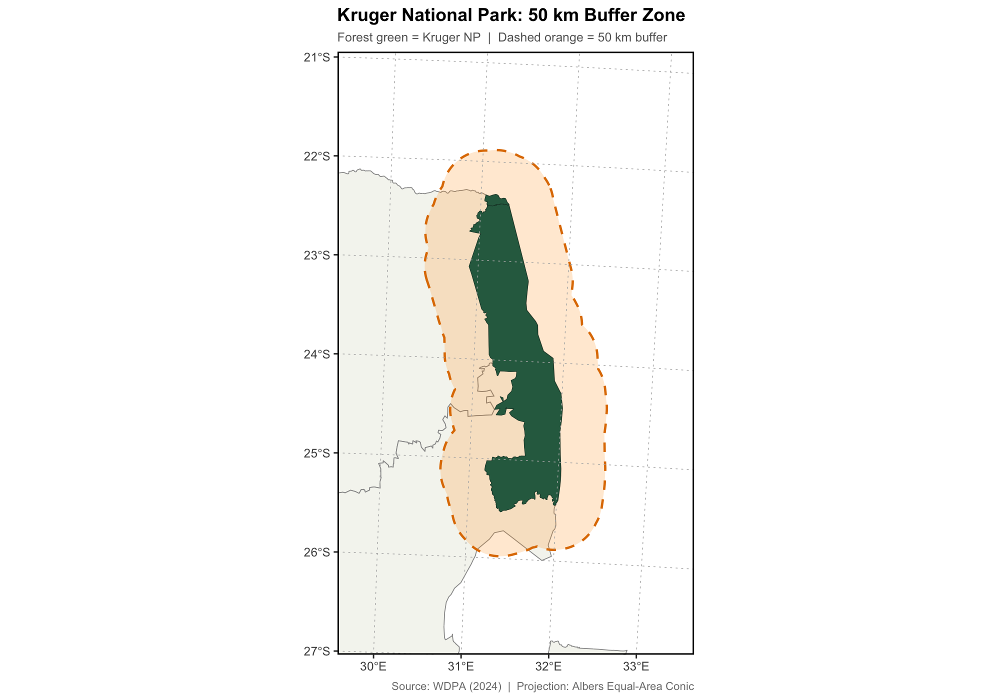

In [25]:
# Map: Kruger + 50 km buffer zone
pad  <- 80000
bbox <- st_bbox(kruger_buffer)

ggplot() +
  geom_sf(data = sa_provinces_proj,
          fill = "#f5f5f0", colour = "grey60", linewidth = 0.3) +
  geom_sf(data = kruger_buffer,
          fill = "#ff990033", colour = "#e07b00",
          linewidth = 0.8, linetype = "dashed") +
  geom_sf(data = kruger,
          fill = "#2d6a4f", colour = "#1b4332") +
  coord_sf(xlim = c(bbox["xmin"] - pad, bbox["xmax"] + pad),
           ylim = c(bbox["ymin"] - pad, bbox["ymax"] + pad)) +
  labs(
    title    = "Kruger National Park: 50 km Buffer Zone",
    subtitle = "Forest green = Kruger NP  |  Dashed orange = 50 km buffer",
    caption  = "Source: WDPA (2024)  |  Projection: Albers Equal-Area Conic"
  ) +
  theme(
    panel.background = element_blank(),
    panel.grid.major = element_line(linetype = "dotted", colour = "grey70", linewidth = 0.25),
    panel.ontop      = TRUE,
    panel.grid.minor = element_blank(),
    panel.border     = element_rect(colour = "black", fill = NA, linewidth = 1),
    plot.title       = element_text(face = "bold", size = 13),
    plot.subtitle    = element_text(size = 9, colour = "grey40"),
    plot.caption     = element_text(size = 8, colour = "grey50")
  )

#### `st_intersection()` — Clipping Features to an Area of Interest

`st_intersection()` returns the parts of one geometry that overlap with another. It is the spatial equivalent of `filter()`, but it clips geometries at the boundary of the intersecting feature rather than simply dropping entire rows.

A typical use case: "Show me only the protected areas within Limpopo province" — essential when you need spatially bounded subsets of national datasets for regional analysis.

In [26]:
# Extract Limpopo province
limpopo <- sa_provinces_proj %>% filter(NAME_1 == "Limpopo")

# Clip protected areas to Limpopo's boundary
limpopo_protected <- st_intersection(sa_protected_proj, limpopo)

cat("Protected areas in South Africa: ", nrow(sa_protected_proj), "\n")
cat("Intersecting Limpopo:            ", nrow(limpopo_protected), "\n")

Warning message:
“attribute variables are assumed to be spatially constant throughout all geometries”


Protected areas in South Africa:  577 
Intersecting Limpopo:             134 


In [27]:
limpopo_protected %>%
  st_drop_geometry() %>%
  count(DESIG_ENG, sort = TRUE) %>%
  head(8)

,DESIG_ENG,n
,<chr>,<int>
1,Nature Reserve,122
2,Forest Nature Reserve,6
3,National Park,3
4,Wetland of International Importance (Ramsar Site),2
5,Forest Wilderness Area,1


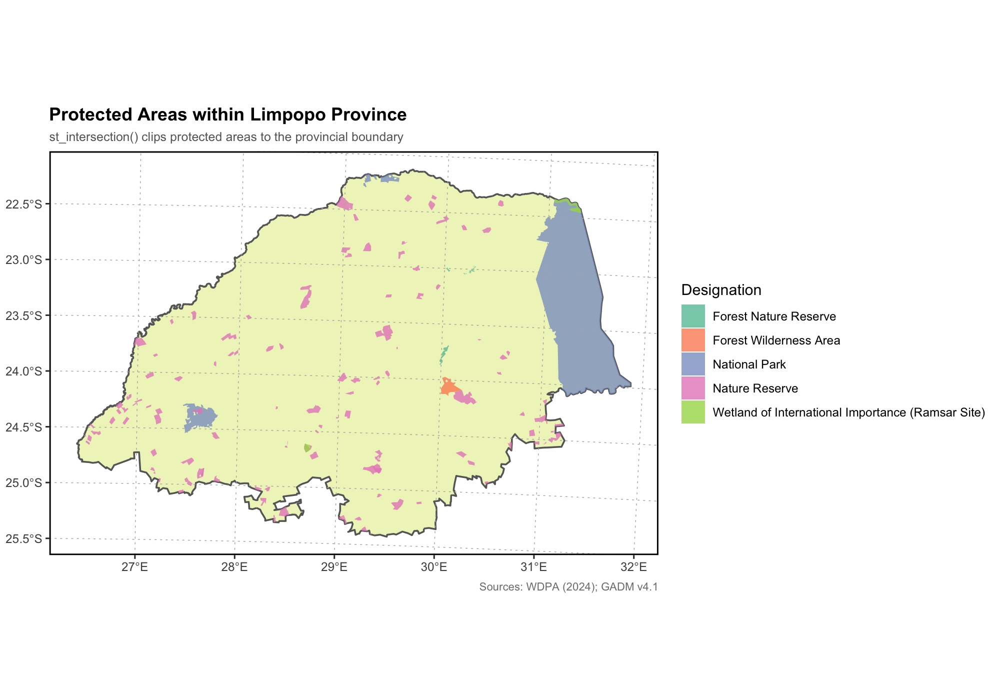

In [28]:
ggplot() +
  geom_sf(data = limpopo,
          fill = "#f0f4c3", colour = "grey40", linewidth = 0.6) +
  geom_sf(data  = limpopo_protected,
          aes(fill = DESIG_ENG),
          colour = NA, alpha = 0.8) +
  scale_fill_brewer(palette = "Set2", name = "Designation") +
  labs(
    title    = "Protected Areas within Limpopo Province",
    subtitle = "st_intersection() clips protected areas to the provincial boundary",
    caption  = "Sources: WDPA (2024); GADM v4.1"
  ) +
  theme(
    panel.background = element_blank(),
    panel.grid.major = element_line(linetype = "dotted", colour = "grey70", linewidth = 0.25),
    panel.ontop      = TRUE,
    panel.grid.minor = element_blank(),
    panel.border     = element_rect(colour = "black", fill = NA, linewidth = 1),
    plot.title       = element_text(face = "bold", size = 13),
    plot.subtitle    = element_text(size = 9, colour = "grey40"),
    plot.caption     = element_text(size = 8, colour = "grey50"),
    legend.position  = "right"
  )

#### `st_union()` — Merging Geometries

`st_union()` dissolves boundaries between features to produce a single merged geometry. Applied to all nine provinces, it reconstructs the national boundary from its parts — a useful sanity check, and a technique for aggregating geometries from finer to coarser scales.

In [29]:
# Union all provinces into a single national polygon
sa_from_union <- sa_provinces_proj %>% st_union()

cat("Area from union (km\u00b2):           ", round(as.numeric(st_area(sa_from_union)) / 1e6), "\n")
cat("Area from country polygon (km\u00b2): ", round(as.numeric(st_area(sa_country_proj)) / 1e6), "\n")

Area from union (km²):            1219709 
Area from country polygon (km²):  1219709 


*Merging geometries might take a while, be patient.*

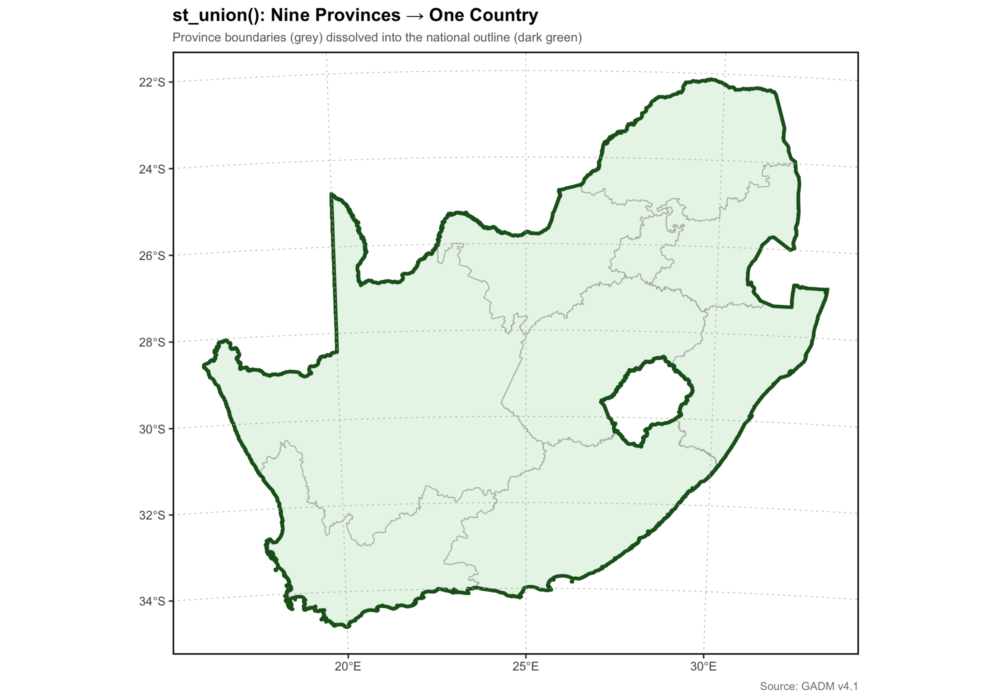

In [30]:
ggplot() +
  geom_sf(data = sa_provinces_proj,
          fill = "#e8f5e9", colour = "grey70", linewidth = 0.3) +
  geom_sf(data = sa_from_union,
          fill = NA, colour = "#1b5e20", linewidth = 1.2) +
  labs(
    title    = "st_union(): Nine Provinces \u2192 One Country",
    subtitle = "Province boundaries (grey) dissolved into the national outline (dark green)",
    caption  = "Source: GADM v4.1"
  ) +
  theme(
    panel.background = element_blank(),
    panel.grid.major = element_line(linetype = "dotted", colour = "grey70", linewidth = 0.25),
    panel.ontop      = TRUE,
    panel.grid.minor = element_blank(),
    panel.border     = element_rect(colour = "black", fill = NA, linewidth = 1),
    plot.title       = element_text(face = "bold", size = 13),
    plot.subtitle    = element_text(size = 9, colour = "grey40"),
    plot.caption     = element_text(size = 8, colour = "grey50")
  )

#### `st_distance()` — Computing Distances

`st_distance()` computes pairwise distances between two sets of features, returning a distance matrix. In a projected CRS the units are metres. Applied to province centroids and national park polygons, it answers: "How far is each province's population centre from the nearest national park?" — a question with implications for environmental justice and eco-tourism access.

In [31]:
# Centroid of each province
province_centroids <- sa_provinces_proj %>% st_centroid()

# National parks only
national_parks <- sa_protected_proj %>% filter(DESIG_ENG == "National Park")

cat("National parks:", nrow(national_parks), "\n")

Warning message:
“st_centroid assumes attributes are constant over geometries”


National parks: 21 


In [32]:
# Distance matrix: 9 provinces x n national parks (units: metres)
dist_matrix <- st_distance(province_centroids, national_parks)
dim(dist_matrix)

[1]  9 21

In [33]:
# For each province, distance (km) to the NEAREST national park
sa_provinces_data <- sa_provinces_data %>%
  mutate(dist_to_np_km = apply(dist_matrix, 1, min) / 1000)

sa_provinces_data %>%
  st_drop_geometry() %>%
  select(NAME_1, dist_to_np_km) %>%
  arrange(desc(dist_to_np_km))

NAME_1,dist_to_np_km
<chr>,<dbl>
North West,271.74755
KwaZulu-Natal,189.18562
Limpopo,164.04836
Free State,161.03808
Northern Cape,135.00957
Mpumalanga,110.09385
Eastern Cape,88.12712
Western Cape,81.09407
Gauteng,38.45197


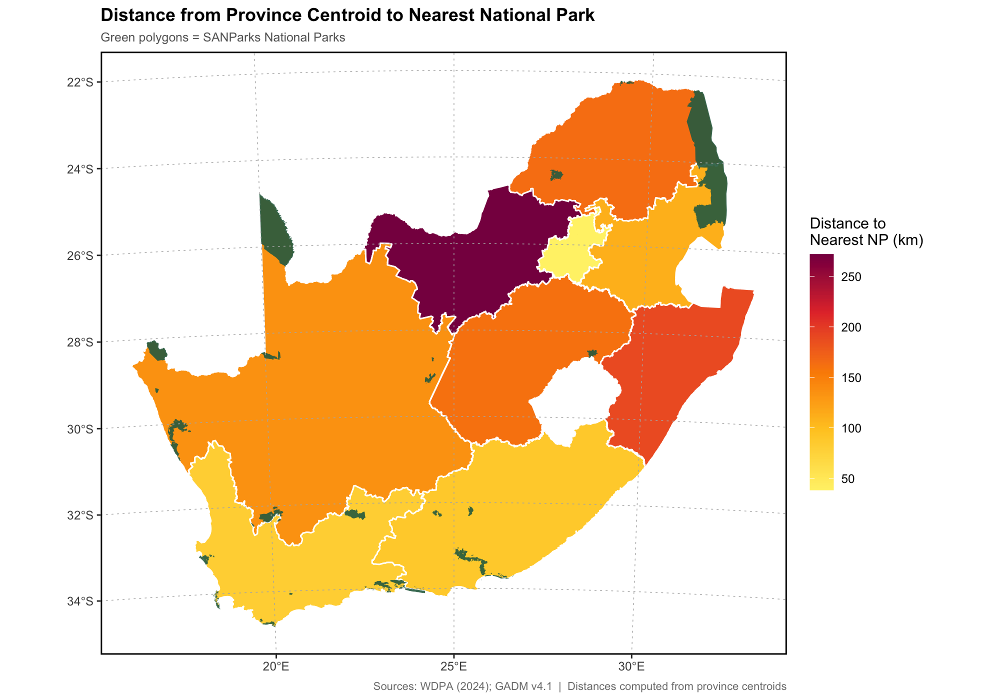

In [34]:
ggplot(sa_provinces_data) +
  geom_sf(aes(fill = dist_to_np_km),
          colour = "white", linewidth = 0.5) +
  geom_sf(data  = national_parks,
          fill   = "#2d6a4f", colour = NA, alpha = 0.9) +
  scale_fill_gradientn(
    colours = c("#fff176", "#ffca28", "#fb8c00", "#e53935", "#880e4f"),
    name    = "Distance to\nNearest NP (km)",
    labels  = comma
  ) +
  labs(
    title    = "Distance from Province Centroid to Nearest National Park",
    subtitle = "Green polygons = SANParks National Parks",
    caption  = "Sources: WDPA (2024); GADM v4.1  |  Distances computed from province centroids"
  ) +
  theme(
    panel.background  = element_blank(),
    panel.grid.major  = element_line(linetype = "dotted", colour = "grey70", linewidth = 0.25),
    panel.ontop       = TRUE,
    panel.grid.minor  = element_blank(),
    panel.border      = element_rect(colour = "black", fill = NA, linewidth = 1),
    plot.title        = element_text(face = "bold", size = 13),
    plot.subtitle     = element_text(size = 9, colour = "grey40"),
    plot.caption      = element_text(size = 8, colour = "grey50"),
    legend.key.height = unit(1.2, "cm")
  )

### 1.11 Adding Cities as Point Features

So far all our features have been polygons. Points are simpler: each feature is a single x, y coordinate pair. We create a cities dataset from a `tibble` using `st_as_sf()`, which converts a data frame with coordinate columns into an `sf` object. This is the standard pattern for any GPS-derived data or tabular data with latitude/longitude columns.

In [35]:
# Major South African cities with WGS84 coordinates
cities_df <- tibble(
  city = c("Johannesburg", "Cape Town", "Durban", "Pretoria",
           "Gqeberha", "Bloemfontein", "East London", "Mbombela",
           "Polokwane", "Kimberley"),
  lon  = c(28.047, 18.424, 30.960, 28.229, 25.602, 26.160,
            27.912, 30.974, 29.465, 24.750),
  lat  = c(-26.204, -33.925, -29.859, -25.748, -33.961, -29.085,
            -33.015, -25.475, -23.904, -28.728)
)

# Convert to sf: specify coordinate columns and CRS, then reproject
cities_sf <- cities_df %>%
  st_as_sf(coords = c("lon", "lat"), crs = 4326) %>%
  st_transform(crs = sa_albers)

# Extract projected coordinates for ggrepel (needs explicit x, y)
cities_coords <- cities_sf %>%
  mutate(X = st_coordinates(.)[, 1],
         Y = st_coordinates(.)[, 2]) %>%
  st_drop_geometry()

cities_sf

Registered S3 method overwritten by 'geojsonsf':
  method        from   
  print.geojson geojson



,city,geometry
,<chr>,<POINT [m]>
1,Johannesburg,POINT (302293.6 -137744.1)
2,Cape Town,POINT (-610896.2 -1007430)
3,Durban,POINT (573377.8 -554376.7)
4,Pretoria,POINT (321549.7 -87281.49)
5,Gqeberha,POINT (55928.42 -996816)
6,Bloemfontein,POINT (112363.1 -456155.7)
7,East London,POINT (272746.4 -895073.7)
8,Mbombela,POINT (596099.9 -66050.72)
9,Polokwane,POINT (451321.1 114914.7)


### 1.12 The Final Map — Bringing It All Together

We now have every ingredient for a publication-quality map:

- Province polygons coloured by population density (choropleth)
- Protected areas as a semi-transparent overlay
- Major cities as labelled point features
- A projected CRS that preserves area
- Scale bar and north arrow from `ggspatial`

The map below synthesises everything introduced in this section.

Warning message in geom_text_repel(data = cities_coords, aes(x = X, y = Y, label = city), :
“Ignoring unknown parameters: `segment.linewidth`”
Scale on map varies by more than 10%, scale bar may be inaccurate



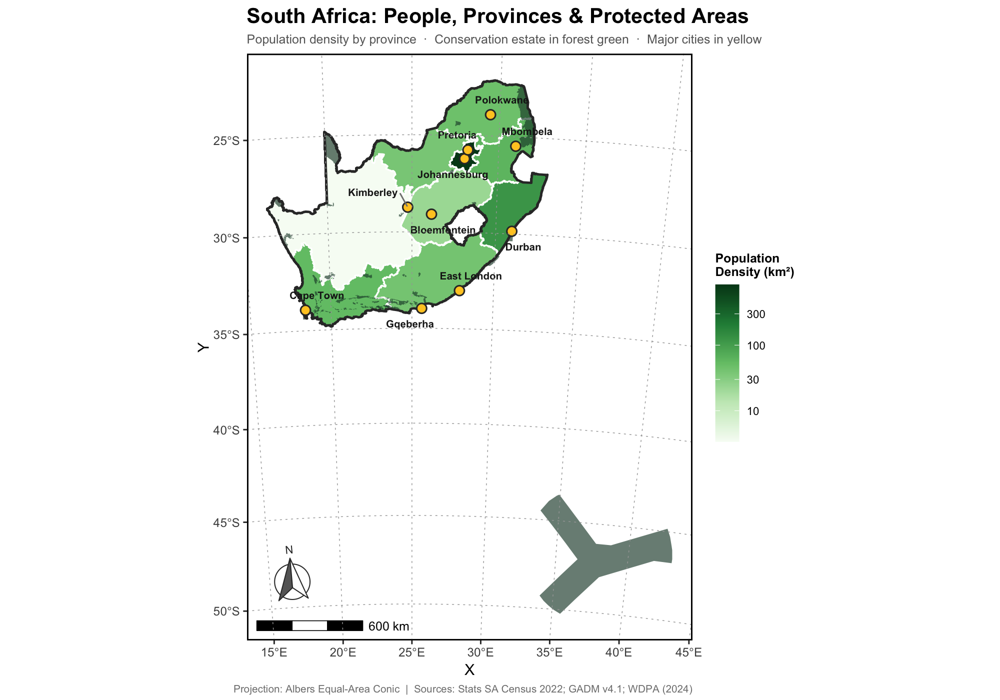

In [36]:
# Keep the most ecologically significant protected area designations
major_pas <- sa_protected_proj %>%
  filter(DESIG_ENG %in% c("National Park", "Marine Protected Area",
                           "World Heritage Site (natural or mixed)",
                           "Ramsar Site, Wetland of International Importance"))

sa_map_final <- ggplot() +

  # 1. Province polygons coloured by population density
  geom_sf(data = sa_provinces_data,
          aes(fill = pop_density),
          colour = "white", linewidth = 0.55) +

  # 2. Protected areas — semi-transparent forest green
  geom_sf(data = major_pas,
          fill = "#1b4332", colour = NA, alpha = 0.65) +

  # 3. Country outline
  geom_sf(data = sa_country_proj,
          fill = NA, colour = "grey20", linewidth = 0.8) +

  # 4. City points
  geom_sf(data = cities_sf,
          shape = 21, size = 2.8,
          fill = "#ffca28", colour = "grey20", stroke = 0.8) +

  # 5. City labels (non-overlapping)
  geom_text_repel(
    data = cities_coords,
    aes(x = X, y = Y, label = city),
    size = 2.6, fontface = "bold", colour = "grey10",
    segment.colour = "grey50", segment.linewidth = 0.35,
    box.padding = 0.5, max.overlaps = 15
  ) +

  # Colour scale
  scale_fill_gradientn(
    colours  = c("#f7fcf5", "#c7e9c0", "#74c476", "#238b45", "#00441b"),
    name     = "Population\nDensity (km\u00b2)",
    labels   = comma,
    trans    = "log10",
    na.value = "grey85",
    guide    = guide_colourbar(barheight = unit(4, "cm"))
  ) +

  # Cartographic elements
  annotation_scale(location = "bl", width_hint = 0.25,
                   text_cex = 0.75, line_width = 0.8) +
  annotation_north_arrow(
    location = "bl", which_north = "true",
    pad_x = unit(0.15, "in"), pad_y = unit(0.35, "in"),
    style = north_arrow_fancy_orienteering(
      fill     = c("grey40", "white"),
      line_col = "grey20", text_col = "grey20", text_size = 8
    )
  ) +

  labs(
    title    = "South Africa: People, Provinces & Protected Areas",
    subtitle = "Population density by province  \u00b7  Conservation estate in forest green  \u00b7  Major cities in yellow",
    caption  = "Projection: Albers Equal-Area Conic  |  Sources: Stats SA Census 2022; GADM v4.1; WDPA (2024)"
  ) +

  theme(
    panel.background  = element_blank(),
    panel.grid.major  = element_line(linetype = "dotted", colour = "grey65", linewidth = 0.25),
    panel.ontop       = TRUE,
    panel.grid.minor  = element_blank(),
    panel.border      = element_rect(colour = "black", fill = NA, linewidth = 1),
    plot.title        = element_text(face = "bold", size = 15),
    plot.subtitle     = element_text(size = 9, colour = "grey40"),
    plot.caption      = element_text(size = 7.5, colour = "grey50"),
    legend.position   = "right",
    legend.title      = element_text(size = 9, face = "bold"),
    legend.text       = element_text(size = 8)
  )

sa_map_final

On second thoughts, let us remove marine protected areas. Although the map is good, personally, I do not like how the marine protected area below makes the map look. Professionally, I would advice to keep it (only if it is relevant to your research).

Warning message in geom_text_repel(data = cities_coords, aes(x = X, y = Y, label = city), :
“Ignoring unknown parameters: `segment.linewidth`”


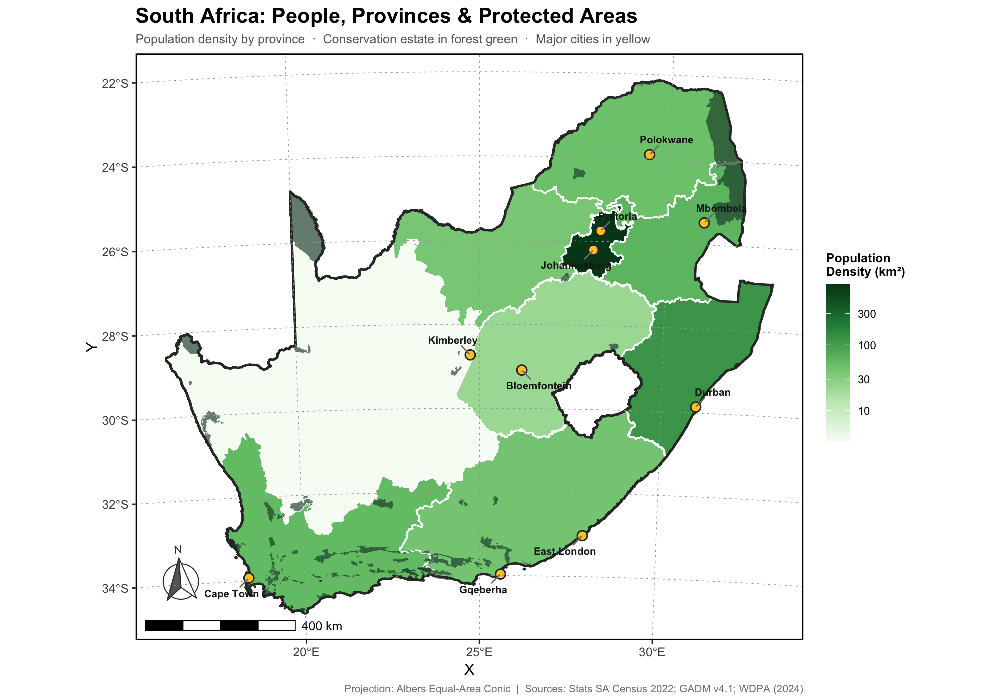

In [37]:
# Keep the most ecologically significant protected area designations
major_pas2 <- sa_protected_proj %>%
  filter(DESIG_ENG %in% c("National Park",
                           "World Heritage Site (natural or mixed)",
                           "Ramsar Site, Wetland of International Importance"))

sa_map_final2 <- ggplot() +

  # 1. Province polygons coloured by population density
  geom_sf(data = sa_provinces_data,
          aes(fill = pop_density),
          colour = "white", linewidth = 0.55) +

  # 2. Protected areas — semi-transparent forest green
  geom_sf(data = major_pas2,
          fill = "#1b4332", colour = NA, alpha = 0.65) +

  # 3. Country outline
  geom_sf(data = sa_country_proj,
          fill = NA, colour = "grey20", linewidth = 0.8) +

  # 4. City points
  geom_sf(data = cities_sf,
          shape = 21, size = 2.8,
          fill = "#ffca28", colour = "grey20", stroke = 0.8) +

  # 5. City labels (non-overlapping)
  geom_text_repel(
    data = cities_coords,
    aes(x = X, y = Y, label = city),
    size = 2.6, fontface = "bold", colour = "grey10",
    segment.colour = "grey50", segment.linewidth = 0.35,
    box.padding = 0.5, max.overlaps = 15
  ) +

  # Colour scale
  scale_fill_gradientn(
    colours  = c("#f7fcf5", "#c7e9c0", "#74c476", "#238b45", "#00441b"),
    name     = "Population\nDensity (km\u00b2)",
    labels   = comma,
    trans    = "log10",
    na.value = "grey85",
    guide    = guide_colourbar(barheight = unit(4, "cm"))
  ) +

  # Cartographic elements
  annotation_scale(location = "bl", width_hint = 0.25,
                   text_cex = 0.75, line_width = 0.8) +
  annotation_north_arrow(
    location = "bl", which_north = "true",
    pad_x = unit(0.15, "in"), pad_y = unit(0.35, "in"),
    style = north_arrow_fancy_orienteering(
      fill     = c("grey40", "white"),
      line_col = "grey20", text_col = "grey20", text_size = 8
    )
  ) +

  labs(
    title    = "South Africa: People, Provinces & Protected Areas",
    subtitle = "Population density by province  \u00b7  Conservation estate in forest green  \u00b7  Major cities in yellow",
    caption  = "Projection: Albers Equal-Area Conic  |  Sources: Stats SA Census 2022; GADM v4.1; WDPA (2024)"
  ) +

  theme(
    panel.background  = element_blank(),
    panel.grid.major  = element_line(linetype = "dotted", colour = "grey65", linewidth = 0.25),
    panel.ontop       = TRUE,
    panel.grid.minor  = element_blank(),
    panel.border      = element_rect(colour = "black", fill = NA, linewidth = 1),
    plot.title        = element_text(face = "bold", size = 15),
    plot.subtitle     = element_text(size = 9, colour = "grey40"),
    plot.caption      = element_text(size = 7.5, colour = "grey50"),
    legend.position   = "right",
    legend.title      = element_text(size = 9, face = "bold"),
    legend.text       = element_text(size = 8)
  )

sa_map_final2

---

## Section 2: The Programmatic Approach — No Downloads Required

In Section 1, the workflow required you to navigate to websites, download archives, unzip them, and manage files on your hard drive. For small projects with infrequently updated data this is perfectly reasonable. But it has real limitations:

- **Reproducibility**: A colleague running your script needs all the same files in the same locations.
- **Version drift**: When GADM or WDPA release updated data, your cached files become stale.
- **Automation**: If you are producing the same analysis for many countries or as a recurring report, manual downloads do not scale.

The solution is R packages that fetch data *programmatically* — using code, not mouse clicks. The data comes from the same authoritative sources (GADM, WDPA, Natural Earth), but R handles downloading, caching, and reading automatically. Your script becomes fully self-contained: anyone can clone your repository and reproduce your results with a single `source()` call.

---

### 2.1 Additional Packages for Programmatic Data Access

In [40]:
# install.packages(c("geodata", "wdpar", "rnaturalearth", "rnaturalearthdata"))
# remotes::install_github("ropensci/rnaturalearthhires")

suppressPackageStartupMessages({
    library(rnaturalearth)
    library(rnaturalearthdata)
    library(rnaturalearthhires)   # required for scale = "large"
    library(geodata)              # GADM, climate, elevation, species
    library(wdpar)                # World Database on Protected Areas
    })

### 2.2 Getting Province Boundaries with `geodata`

The `geodata` package provides a one-line interface to the same GADM data you downloaded manually in Section 1. Downloaded files are cached locally, so subsequent calls are fast. It returns a `terra` `SpatVector`, which we convert to `sf` with `st_as_sf()`.

In [41]:
# Download GADM Level 1 (provinces) for South Africa
sa_provinces_auto <- geodata::gadm(country = "ZAF", level = 1, path = tempdir()) %>%
  st_as_sf()

# Country boundary (Level 0)
sa_country_auto <- geodata::gadm(country = "ZAF", level = 0, path = tempdir()) %>%
  st_as_sf()

# Reproject both
sa_provinces_auto_proj <- sa_provinces_auto %>% st_transform(crs = sa_albers)
sa_country_auto_proj   <- sa_country_auto   %>% st_transform(crs = sa_albers)

cat("Provinces in auto dataset:", nrow(sa_provinces_auto_proj), "\n")
head(sa_provinces_auto_proj["NAME_1"], 4)

Provinces in auto dataset: 9 


,NAME_1,geometry
,<chr>,<GEOMETRY [m]>
1,Eastern Cape,MULTIPOLYGON (((-8932.448 -...
2,Free State,"POLYGON ((141728.2 -628273,..."
3,Gauteng,POLYGON ((280381.9 -198110....
4,KwaZulu-Natal,MULTIPOLYGON (((503596.6 -6...


Column names are identical to the manually downloaded shapefile because the underlying source is the same GADM database. The only difference is *how* the data arrived.

`rnaturalearth` provides a convenient alternative with slightly lower resolution — sufficient for most regional mapping tasks:

In [42]:
# rnaturalearth: province-level data from Natural Earth
sa_provinces_ne <- rnaturalearth::ne_states(
  country     = "south africa",
  returnclass = "sf"
)

# Natural Earth uses different column names
glimpse(sa_provinces_ne[, c("name", "region", "type_en")])

Rows: 9
Columns: 4
$ name     <chr> "Northern Cape", "KwaZulu-Natal", "Free State", "Eastern Cape…
$ region   <chr> NA, NA, NA, NA, NA, NA, NA, NA, NA
$ type_en  <chr> "Province", "Province", "Province", "Province", "Province", "…
$ geometry <MULTIPOLYGON [°]> MULTIPOLYGON (((16.48707 -2..., MULTIPOLYGON (((28.98085 -2..…


### 2.3 Getting Protected Areas with `wdpar`

The `wdpar` package interfaces directly with the Protected Planet API. `wdpa_fetch()` downloads the WDPA dataset for a country; `wdpa_clean()` applies standard quality-control steps: removing invalid geometries, duplicate records, and marine-only designations.

> **Note on download time**: `wdpa_fetch()` contacts the internet and may take several minutes for South Africa. Data are cached between sessions — run this cell once, and subsequent calls will be fast.

**Note for Mac users**: `wdpar` package uses the chromote package to scrape download URLs from the Protected Planet website, which requires a Chromium-based browser. Chrome needs to be installed and placed under Applications. Run this line before running `wdpa_fetch()`:

```
# Set the path to the Chrome executable on your Mac
Sys.setenv(CHROMOTE_CHROME = "/Applications/Google Chrome.app/Contents/MacOS/Google Chrome")
```

In [46]:
Sys.setenv(CHROMOTE_CHROME = "/Applications/Google Chrome.app/Contents/MacOS/Google Chrome")

In [47]:
# Fetch and clean the South Africa WDPA dataset
sa_pa_auto <- wdpar::wdpa_fetch("South Africa", wait = TRUE)
sa_pa_auto_clean <- wdpar::wdpa_clean(sa_pa_auto)

# Reproject
sa_pa_auto_proj <- sa_pa_auto_clean %>% st_transform(crs = sa_albers)

cat("Protected area polygons (after cleaning):", nrow(sa_pa_auto_proj), "\n")

Warning message in CPL_read_ogr(dsn, layer, query, as.character(options), quiet, :
“GDAL Message 1: organizePolygons() received a polygon with more than 100 parts. The processing may be really slow.  You can skip the processing by setting METHOD=SKIP, or only make it analyze counter-clock wise parts by setting METHOD=ONLY_CCW if you can assume that the outline of holes is counter-clock wise defined”


Protected area polygons (after cleaning): 1679 


In [48]:
sa_pa_auto_proj %>%
  st_drop_geometry() %>%
  count(DESIG_ENG, sort = TRUE) %>%
  head(8)

DESIG_ENG,n
<chr>,<int>
Nature Reserve,1431
Protected Environment,69
Forest Nature Reserve,52
Marine Protected Area,42
Wetland of International Importance (Ramsar Site),31
National Park,22
Mountain Catchment Area,16
Forest Wilderness Area,12


The cleaning step may return slightly fewer rows than the raw fetch because it removes invalid geometries and duplicate records — exactly the quality-control steps that the WDPA documentation recommends and that you would otherwise apply manually.

### 2.4 Preparing the Joined Data and Cities

The attribute join and city creation are identical to Section 1. We reuse the same `province_data` and `cities_df` objects we created earlier. This illustrates an important principle: **data wrangling code does not change; only the data acquisition step differs between workflows**.

In [50]:
# Attribute join (same province_data tibble as Section 1)
sa_provinces_auto_data <- sa_provinces_auto_proj %>%
  left_join(province_data, by = "NAME_1") %>%
  mutate(pop_density = population / area_km2)

# Cities (same cities_df as Section 1)
cities_sf_auto <- cities_df %>%
  st_as_sf(coords = c("lon", "lat"), crs = 4326) %>%
  st_transform(crs = sa_albers)

cities_coords_auto <- cities_sf_auto %>%
  mutate(X = st_coordinates(.)[, 1],
         Y = st_coordinates(.)[, 2]) %>%
  st_drop_geometry()

# Major protected areas
major_pas_auto <- sa_pa_auto_proj %>%
  filter(DESIG_ENG %in% c("National Park",
                           "World Heritage Site (natural or mixed)",
                           "Ramsar Site, Wetland of International Importance"))

cat("Join complete. Province rows:", nrow(sa_provinces_auto_data), "\n")

Join complete. Province rows: 9 


### 2.5 Reproducing the Final Map — Programmatically

The map code below is essentially identical to the Section 1 final map. Only the data objects differ. The visual result should be indistinguishable — which is the whole point: **reproducible code produces reproducible results**, regardless of how the underlying data arrived.

Warning message in geom_text_repel(data = cities_coords_auto, aes(x = X, y = Y, :
“Ignoring unknown parameters: `segment.linewidth`”


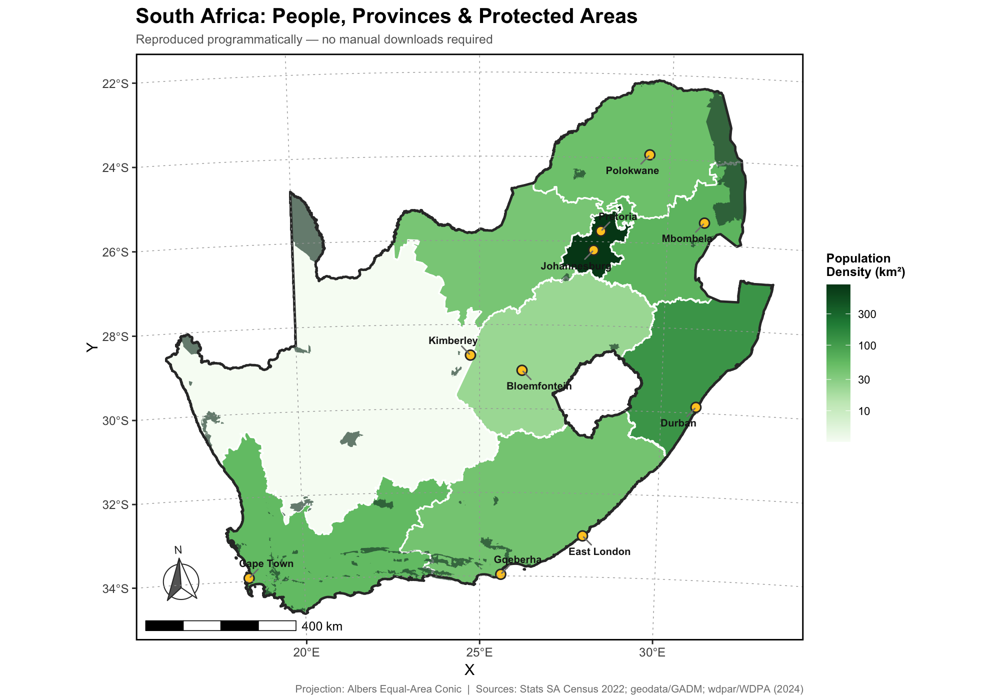

In [51]:
sa_map_programmatic <- ggplot() +

  geom_sf(data = sa_provinces_auto_data,
          aes(fill = pop_density),
          colour = "white", linewidth = 0.55) +

  geom_sf(data = major_pas_auto,
          fill = "#1b4332", colour = NA, alpha = 0.65) +

  geom_sf(data = sa_country_auto_proj,
          fill = NA, colour = "grey20", linewidth = 0.8) +

  geom_sf(data = cities_sf_auto,
          shape = 21, size = 2.8,
          fill = "#ffca28", colour = "grey20", stroke = 0.8) +

  geom_text_repel(
    data = cities_coords_auto,
    aes(x = X, y = Y, label = city),
    size = 2.6, fontface = "bold", colour = "grey10",
    segment.colour = "grey50", segment.linewidth = 0.35,
    box.padding = 0.5, max.overlaps = 15
  ) +

  scale_fill_gradientn(
    colours  = c("#f7fcf5", "#c7e9c0", "#74c476", "#238b45", "#00441b"),
    name     = "Population\nDensity (km\u00b2)",
    labels   = comma, trans = "log10",
    na.value = "grey85",
    guide    = guide_colourbar(barheight = unit(4, "cm"))
  ) +

  annotation_scale(location = "bl", width_hint = 0.25,
                   text_cex = 0.75, line_width = 0.8) +
  annotation_north_arrow(
    location = "bl", which_north = "true",
    pad_x = unit(0.15, "in"), pad_y = unit(0.35, "in"),
    style = north_arrow_fancy_orienteering(
      fill = c("grey40", "white"), line_col = "grey20",
      text_col = "grey20", text_size = 8
    )
  ) +

  labs(
    title    = "South Africa: People, Provinces & Protected Areas",
    subtitle = "Reproduced programmatically — no manual downloads required",
    caption  = "Projection: Albers Equal-Area Conic  |  Sources: Stats SA Census 2022; geodata/GADM; wdpar/WDPA (2024)"
  ) +

  theme(
    panel.background  = element_blank(),
    panel.grid.major  = element_line(linetype = "dotted", colour = "grey65", linewidth = 0.25),
    panel.ontop       = TRUE,
    panel.grid.minor  = element_blank(),
    panel.border      = element_rect(colour = "black", fill = NA, linewidth = 1),
    plot.title        = element_text(face = "bold", size = 15),
    plot.subtitle     = element_text(size = 9, colour = "grey40"),
    plot.caption      = element_text(size = 7.5, colour = "grey50"),
    legend.position   = "right",
    legend.title      = element_text(size = 9, face = "bold"),
    legend.text       = element_text(size = 8)
  )

sa_map_programmatic

### 2.6 A Side-by-Side Comparison with `patchwork`

`patchwork` lets us compose multiple `ggplot2` objects into a single figure. Placing the two maps side-by-side makes the equivalence of the two workflows immediately visible.

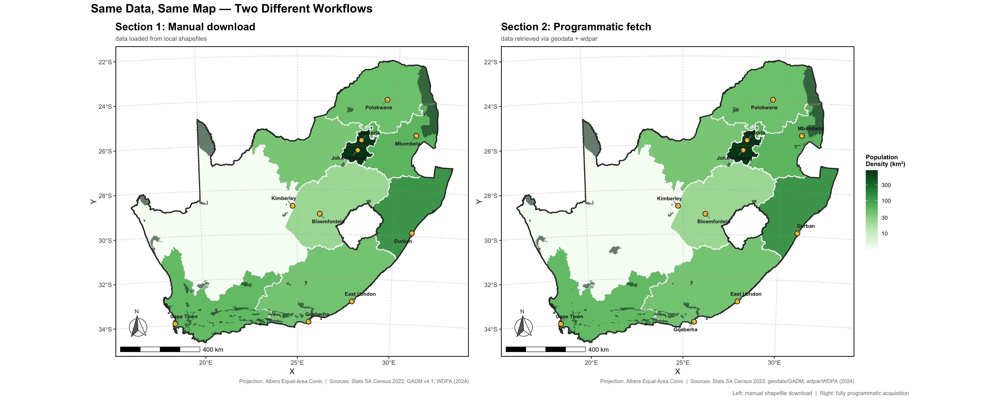

In [52]:
options(repr.plot.width = 20, repr.plot.height = 8, repr.plot.res = 200)

map_A <- sa_map_final2 +
  labs(title = "Section 1: Manual download",
       subtitle = "data loaded from local shapefiles") +
  theme(legend.position = "none")

map_B <- sa_map_programmatic +
  labs(title = "Section 2: Programmatic fetch",
       subtitle = "data retrieved via geodata + wdpar") +
  theme(legend.position = "right")

map_A + map_B +
  plot_annotation(
    title   = "Same Data, Same Map \u2014 Two Different Workflows",
    caption = "Left: manual shapefile download  |  Right: fully programmatic acquisition",
    theme   = theme(
      plot.title   = element_text(face = "bold", size = 17),
      plot.caption = element_text(size = 8, colour = "grey50")
    )
  )

In [54]:
# Reset plot dimensions
options(repr.plot.width = 10, repr.plot.height = 7, repr.plot.res = 200)

---

## Summary

This notebook has introduced the core workflow for vector spatial data in R using the `sf` package.

**Data I/O**
- `st_read()` reads shapefiles, GeoPackages, and dozens of other formats through GDAL
- `st_write()` saves spatial objects; prefer GeoPackage (`.gpkg`) over shapefile for new data

**Exploration**
- `sf` objects are data frames with a special geometry column — all `dplyr` verbs apply
- Always run `st_geometry_type()`, `st_crs()`, and `st_bbox()` on any new dataset
- `st_drop_geometry()` returns the attribute table as a plain tibble

**Coordinate Reference Systems**
- Check CRS with `st_crs()`; reproject with `st_transform()`
- Use a projected CRS (metres) for any distance or area calculation
- The Albers Equal-Area Conic is a good default for South Africa-wide analyses

**Attribute Joins**
- `left_join()` attaches tabular data to spatial objects via a shared key column
- The result is a spatially enriched `sf` object ready for choropleth mapping

**Geometry Operations** (GEOS-powered)
- `st_buffer(dist)` — expand features outward by a distance
- `st_intersection(x, y)` — clip to the overlap of two geometries
- `st_union()` — dissolve boundaries between features
- `st_distance(x, y)` — compute pairwise distance matrix (units: metres in projected CRS)

**Visualisation**
- `geom_sf()` integrates directly with `ggplot2`
- `geom_sf_text()` labels features at their centroids
- `ggrepel::geom_text_repel()` avoids overlapping labels
- `ggspatial::annotation_scale()` and `annotation_north_arrow()` add cartographic elements

**Programmatic Data Access**
- `geodata::gadm()` fetches GADM administrative boundaries
- `rnaturalearth::ne_states()` provides Natural Earth province boundaries
- `wdpar::wdpa_fetch()` + `wdpa_clean()` provides analysis-ready WDPA data

---

## References

Bivand, R. (2023). Progress in modernizing and replacing infrastructure packages in R-spatial workflows. *R-Spatial Evolution Project Report*. https://r-spatial.github.io/evolution/

Hijmans, R. J. (2023). *geodata: Download Geographic Data*. R package, version 0.5.10. https://CRAN.R-project.org/package=geodata

Lovelace, R., Nowosad, J. and Muenchow, J. (2025). *Geocomputation with R*, 2nd edn. CRC Press, Boca Raton. https://r.geocompx.org/

Pebesma, E. (2018). Simple Features for R: standardized support for spatial vector data. *The R Journal* 10(1): 439–446.

Pebesma, E. and Bivand, R. (2023). *Spatial Data Science: With Applications in R*. Chapman and Hall/CRC. https://r-spatial.org/book/

Slater, H. (2024). *wdpar: Interface to the World Database on Protected Areas*. R package. https://CRAN.R-project.org/package=wdpar

South African National Parks (2024). *SANParks National Parks*. https://www.sanparks.org

Statistics South Africa (2023). *Census 2022 Statistical Release*. Statistics South Africa, Pretoria.

Tennekes, M. (2018). tmap: Thematic maps in R. *Journal of Statistical Software* 84(6): 1–39.

Tuan, Y.-F. (1974). *Topophilia: A Study of Environmental Perceptions, Attitudes, and Values*. Prentice-Hall, Englewood Cliffs.

UNEP-WCMC and IUCN (2024). *Protected Planet: The World Database on Protected Areas (WDPA)*. UNEP-WCMC and IUCN, Cambridge. www.protectedplanet.net

---

*End of Part 2. Part 3 introduces raster data with `terra` and `stars`: loading GeoTIFFs, computing NDVI, and basic raster algebra over South African landscapes.*